In [ ]:
import sys
from wordcloud import WordCloud
import pandas as pd
import matplotlib.pyplot as plt
from collections import defaultdict
from itertools import combinations
from sklearn.feature_extraction.text import CountVectorizer




In [2]:
#Establishing df
df = pd.read_csv("netflix_titles.csv")
df.rename(columns={"listed_in":"genre"}, inplace =True)
display(df.head(3))
display(df.columns)


,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,genre,description
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm..."
1,s2,TV Show,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",NaN,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...


Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'genre', 'description'],
      dtype='object')

In [8]:
# Find the most active director aka director that appears most times
ex1 = df.dropna(subset=["director"]).copy()
display(ex1.head(3))
directors = ex1["director"].value_counts().reset_index()
# most active ie top 10 
display(directors.head(10))

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm..."
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",NaN,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...
5,s6,TV Show,Midnight Mass,Mike Flanagan,"Kate Siegel, Zach Gilford, Hamish Linklater, H...",NaN,"September 24, 2021",2021,TV-MA,1 Season,"TV Dramas, TV Horror, TV Mysteries",The arrival of a charismatic young priest brin...


,director,count
0,Rajiv Chilaka,19
1,"Raúl Campos, Jan Suter",18
2,Marcus Raboy,16
3,Suhas Kadav,16
4,Jay Karas,14
5,Cathy Garcia-Molina,13
6,Martin Scorsese,12
7,Youssef Chahine,12
8,Jay Chapman,12
9,Steven Spielberg,11


In [16]:
#List actors with most appearances
ex2 = df.dropna(subset=["cast"]).copy()
ex2["cast"] = ex2["cast"].str.split(",")
ex2 = ex2.explode("cast")
display(ex2.head(10))
popularCast = ex2["cast"].value_counts().reset_index()
display(popularCast.head(15))

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
1,s2,TV Show,Blood & Water,NaN,Ama Qamata,South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
1,s2,TV Show,Blood & Water,NaN,Khosi Ngema,South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
1,s2,TV Show,Blood & Water,NaN,Gail Mabalane,South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
1,s2,TV Show,Blood & Water,NaN,Thabang Molaba,South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
1,s2,TV Show,Blood & Water,NaN,Dillon Windvogel,South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
1,s2,TV Show,Blood & Water,NaN,Natasha Thahane,South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
1,s2,TV Show,Blood & Water,NaN,Arno Greeff,South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
1,s2,TV Show,Blood & Water,NaN,Xolile Tshabalala,South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
1,s2,TV Show,Blood & Water,NaN,Getmore Sithole,South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
1,s2,TV Show,Blood & Water,NaN,Cindy Mahlangu,South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."


,cast,count
0,Anupam Kher,39
1,Rupa Bhimani,31
2,Takahiro Sakurai,30
3,Julie Tejwani,28
4,Om Puri,27
5,Rajesh Kava,26
6,Shah Rukh Khan,26
7,Yuki Kaji,25
8,Paresh Rawal,25
9,Andrea Libman,25


In [20]:
#Find the most common actor parings
# could create a default dcitionary where the actor pair is the key
ex3 = df.dropna(subset=["cast"]).copy()
ex3["cast"] = ex3["cast"].str.split(",")

pairCounter = defaultdict(int)

for actorList in ex3["cast"]:
    if len(actorList) >=2:
        for pair in combinations(actorList,2): pairCounter[pair] +=1
orderedList = sorted(pairCounter.items(), key = lambda x:x[1], reverse=True)
display(orderedList[:5])

[((' Rupa Bhimani', ' Rajesh Kava'), 22),
 ((' Julie Tejwani', ' Rajesh Kava'), 21),
 ((' Jigna Bhardwaj', ' Rajesh Kava'), 20),
 ((' Julie Tejwani', ' Rupa Bhimani'), 19),
 ((' Julie Tejwani', ' Jigna Bhardwaj'), 19)]

In [ ]:
#Top 3 actors/acctresses for each genre

ex4 = df.dropna(subset=["cast","genre"]).copy()
ex4["cast"] = ex4["cast"].str.split(",")
ex4["genre"] = ex4["genre"].str.split(",")
ex4 = ex4.explode("genre")
ex4 = ex4.explode("cast")
# then grouby by cast and genre
castGenre = ex4.groupby(["genre","cast"]).size().reset_index(name="count")
ordered = castGenre.sort_values(["count","genre"], ascending=[False,True])
# now to get top 3 for each genre
top3 = ordered.groupby("genre").head(3)
display(top3.head(30))

,genre,cast,count
19435,International Movies,Anupam Kher,33
80806,Children & Family Movies,Rupa Bhimani,25
79758,Children & Family Movies,Julie Tejwani,24
76550,Anime Series,Takahiro Sakurai,23
20090,International Movies,Boman Irani,22
26263,International Movies,Om Puri,22
35080,International TV Shows,Takahiro Sakurai,21
80636,Children & Family Movies,Rajesh Kava,21
75820,Anime Series,Ai Kayano,17
32104,International TV Shows,Ai Kayano,16


In [12]:
#Frequent collabs between drirector and cast
ex5 = df.dropna(subset=["cast","director"]).copy()
ex5["cast"] = ex5["cast"].str.split(",")
ex5 = ex5.explode("cast")
# make a default dict of cast and actor
collabCount = ex5.groupby(["director","cast"]).size().reset_index(name="count")
collabCount = collabCount.sort_values(by="count", ascending=False)
display(collabCount)



,director,cast,count
31682,Rajiv Chilaka,Rajesh Kava,17
31678,Rajiv Chilaka,Julie Tejwani,17
31677,Rajiv Chilaka,Jigna Bhardwaj,17
31683,Rajiv Chilaka,Rupa Bhimani,16
31688,Rajiv Chilaka,Vatsal Dubey,15
...,...,...,...
14635,Hirotsugu Kawasaki,Junko Takeuchi,1
14636,Hiroyuki Seshita,Aki Toyosaki,1
14637,Hiroyuki Seshita,Aya Suzaki,1
14638,Hiroyuki Seshita,Kana Hanazawa,1


In [ ]:
#Find extremes of duration 
# plot the duration as a bar chart with time and count 
# could then query table to find the name of the outliers
# to properly find the outliers find the sd and mean 2sd from mean

In [11]:
ex6 = df[df["type"]=="Movie"].dropna(subset=["duration"])
ex6["duration"] = ex6["duration"].str.replace(" min","")
ex6["duration"] = pd.to_numeric(ex6["duration"], errors = "coerce")
mean = ex6["duration"].mean()
std = ex6["duration"].std()
print(f"mean {mean} SD: {std}")
lowerOutliers = ex6[ex6["duration"]< (mean - 2*std)]
upperOutliers = ex6[ex6["duration"]> (mean + 2*std)]
print(f"lower outliers {len(lowerOutliers)}")
print(f"upper outliers {len(upperOutliers)}")
display(lowerOutliers)
display(upperOutliers)



mean 99.57718668407311 SD: 28.290593447417397
lower outliers 195
upper outliers 181


,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,genre,description
45,s46,Movie,My Heroes Were Cowboys,Tyler Greco,NaN,NaN,"September 16, 2021",2021,PG,23,Documentaries,Robin Wiltshire's painful childhood was rescue...
71,s72,Movie,A StoryBots Space Adventure,David A. Vargas,"Evan Spiridellis, Erin Fitzgerald, Jeff Gill, ...",NaN,"September 14, 2021",2021,TV-Y,13,Children & Family Movies,Join the StoryBots and the space travelers of ...
470,s471,Movie,Bridgerton - The Afterparty,NaN,"David Spade, London Hughes, Fortune Feimster",NaN,"July 13, 2021",2021,TV-14,39,Movies,"""Bridgerton"" cast members share behind-the-sce..."
495,s496,Movie,Awon Boyz,Tolulope Itegboje,NaN,NaN,"July 7, 2021",2019,TV-MA,38,"Documentaries, International Movies",This documentary takes a close look at the liv...
560,s561,Movie,Audible,Matt Ogens,NaN,NaN,"July 1, 2021",2021,PG-13,39,"Documentaries, Sports Movies","Shaken by a friend's suicide, a Deaf high scho..."
...,...,...,...,...,...,...,...,...,...,...,...,...
8436,s8437,Movie,The Negro Soldier,Stuart Heisler,NaN,United States,"March 31, 2017",1944,TV-14,40,"Classic Movies, Documentaries",This documentary urged African Americans to en...
8500,s8501,Movie,The Search for Life in Space,Stephen Amezdroz,NaN,United States,"April 1, 2018",2016,TV-G,32,Documentaries,To determine whether we're alone in the univer...
8587,s8588,Movie,Thunderbolt,"William Wyler, John Sturges","James Stewart, Lloyd Bridges",United States,"March 31, 2017",1947,TV-PG,42,"Classic Movies, Documentaries",A P-47 Thunderbolt squadron is shown in prepar...
8657,s8658,Movie,Under an Arctic Sky,Chris Burkard,"Chris Burkard, Sam Hammer, Heidar Logi, Elli T...",United States,"December 15, 2017",2017,TV-14,40,"Action & Adventure, Documentaries, Sports Movies",Six fearless surfers travel to the north coast...


,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,genre,description
22,s23,Movie,Avvai Shanmughi,K.S. Ravikumar,"Kamal Hassan, Meena, Gemini Ganesan, Heera Raj...",NaN,"September 21, 2021",1996,TV-PG,161,"Comedies, International Movies",Newly divorced and denied visitation rights wi...
24,s25,Movie,Jeans,S. Shankar,"Prashanth, Aishwarya Rai Bachchan, Sri Lakshmi...",India,"September 21, 2021",1998,TV-14,166,"Comedies, International Movies, Romantic Movies",When the father of the man she loves insists t...
73,s74,Movie,King of Boys,Kemi Adetiba,"Sola Sobowale, Adesua Etomi, Remilekun ""Remini...",Nigeria,"September 14, 2021",2018,TV-MA,182,"Dramas, International Movies",When a powerful businesswoman’s political ambi...
166,s167,Movie,Once Upon a Time in America,Sergio Leone,"Robert De Niro, James Woods, Elizabeth McGover...","Italy, United States","September 1, 2021",1984,R,229,"Classic Movies, Dramas",Director Sergio Leone's sprawling crime epic f...
202,s203,Movie,Kyaa Kool Hai Hum,Sangeeth Sivan,"Tusshar Kapoor, Riteish Deshmukh, Isha Koppika...",India,"August 27, 2021",2005,TV-MA,165,"Comedies, International Movies, Music & Musicals",Longtime friends Rahul and Karan head to Mumba...
...,...,...,...,...,...,...,...,...,...,...,...,...
8639,s8640,Movie,Tukaram,Chandrakant Kulkarni,"Jitendra Joshi, Prateeksha Lonkar, Sharad Ponk...",India,"February 15, 2018",2012,TV-PG,162,"Dramas, Faith & Spirituality, International Mo...",A child whose innocence and devotion set him a...
8764,s8765,Movie,Wyatt Earp,Lawrence Kasdan,"Kevin Costner, Dennis Quaid, Gene Hackman, Dav...",United States,"January 1, 2020",1994,PG-13,191,Action & Adventure,Legendary lawman Wyatt Earp is continually at ...
8770,s8771,Movie,Yaadein,Subhash Ghai,"Jackie Shroff, Hrithik Roshan, Kareena Kapoor,...",India,"March 1, 2018",2001,TV-14,171,"Dramas, International Movies, Romantic Movies",Two young lovers set out to overcome the obsta...
8788,s8789,Movie,You Carry Me,Ivona Juka,"Lana Baric, Vojislav Brajovic, Natasa Janjic, ...","Croatia, Slovenia, Serbia, Montenegro","July 1, 2016",2015,TV-MA,157,"Dramas, International Movies","A soap opera producer, director and makeup art..."


In [ ]:
#Extract and rank common keywords form the description
ex7 = df.dropna(subset=["description"])
vectorizer = CountVectorizer(stop_words = "english")
# creates a matrix/ table where each column is a new word 
#each row has the phrase and then number indicating which word in the column appears
X = vectorizer.fit_transform(df["description"])
# convert to numpy 2d array
#adding all values in each column
word_counts = X.toarray().sum(axis=0)
word_freq = dict(zip(vectorizer.get_feature_names_out(), word_counts))
sorted_word_freq = sorted(word_freq.items(), key=lambda x: x[1], reverse=True)
top_n = 10
for word, freq in sorted_word_freq[:top_n]:
    print(f"{word}: {freq}")


,input,'content'
,encoding,'utf-8'
,decode_error,'strict'
,strip_accents,None
,lowercase,True
,preprocessor,None
,tokenizer,None
,stop_words,'english'
,token_pattern,'(?u)\\b\\w\\w+\\b'
,ngram_range,"(1, ...)"
,analyzer,'word'


life: 845
young: 729
new: 709
family: 635
world: 570
man: 538
love: 504
woman: 486
friends: 445
series: 396


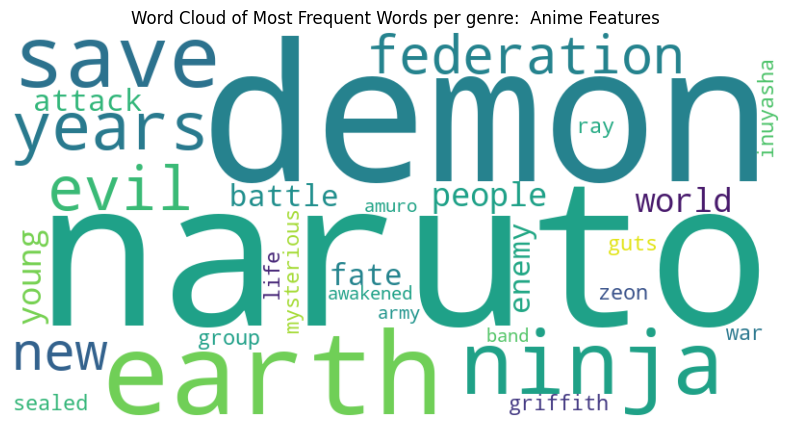

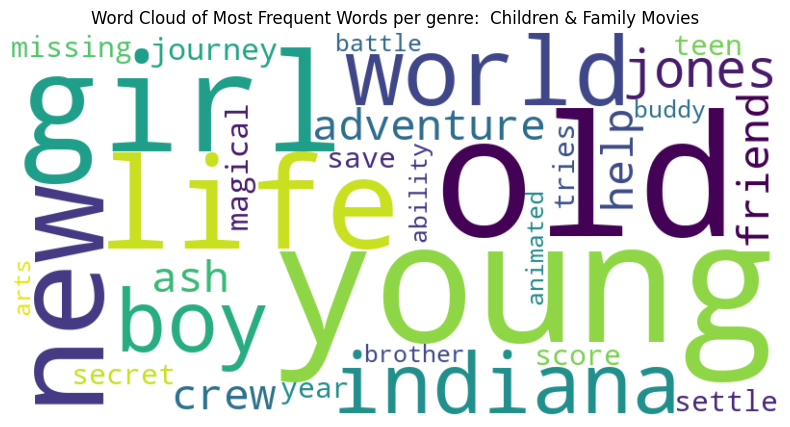

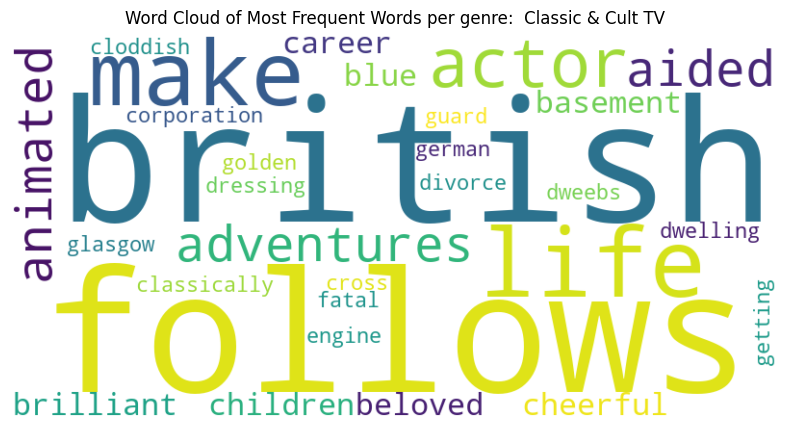

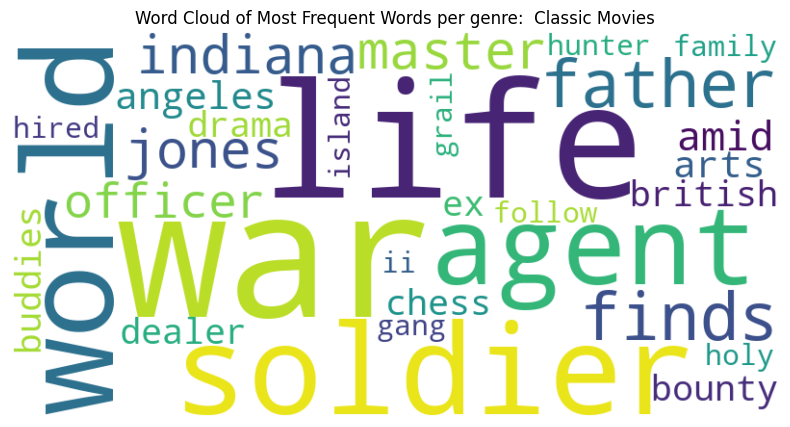

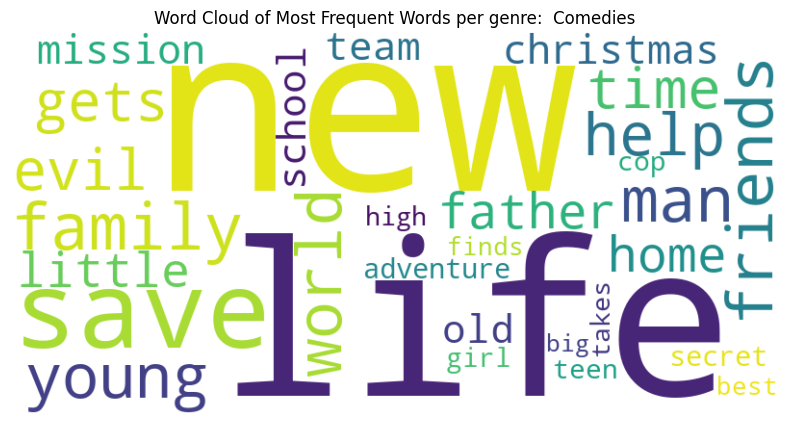

...

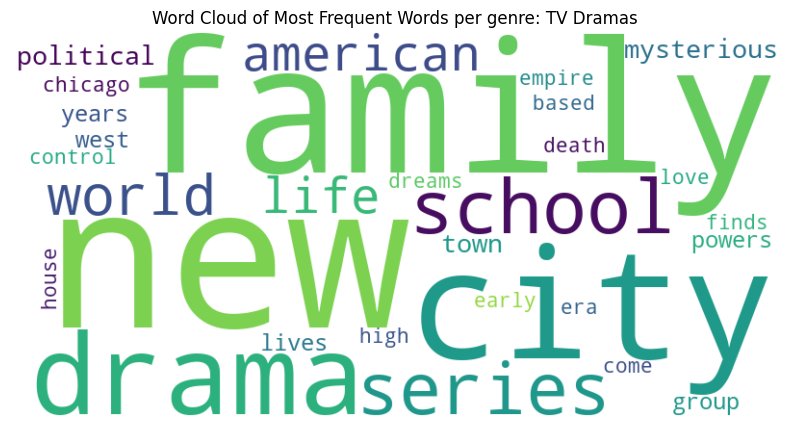

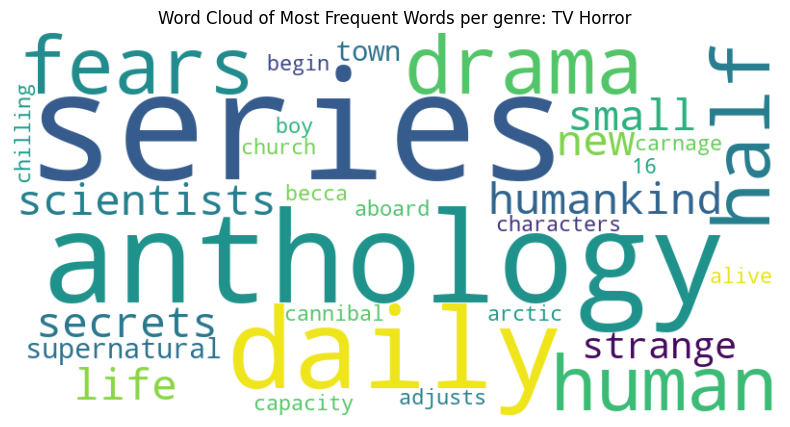

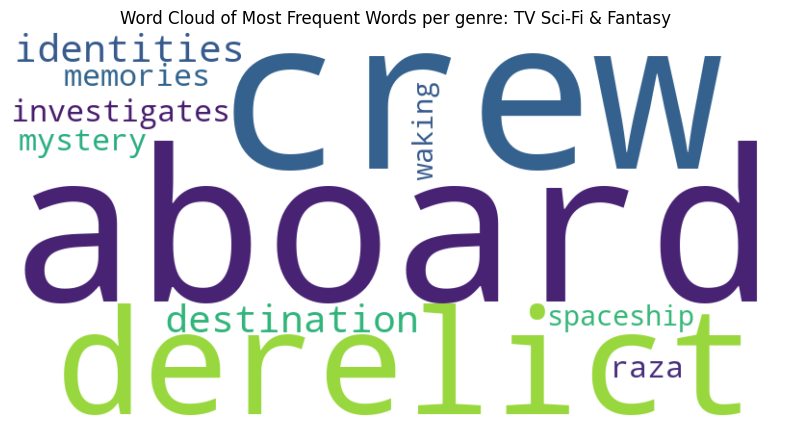

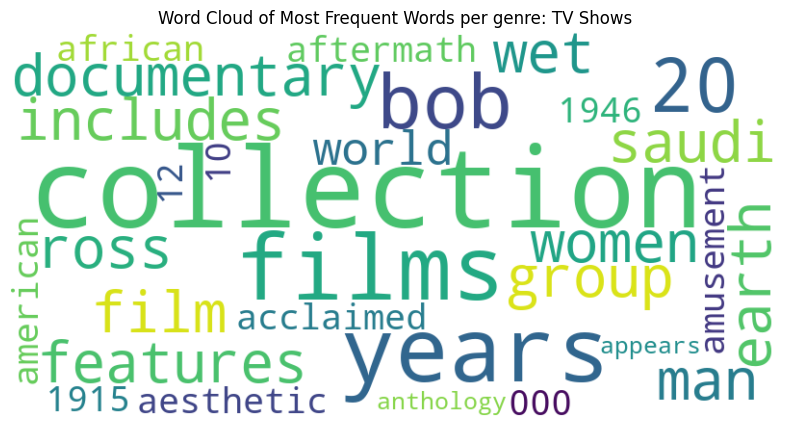

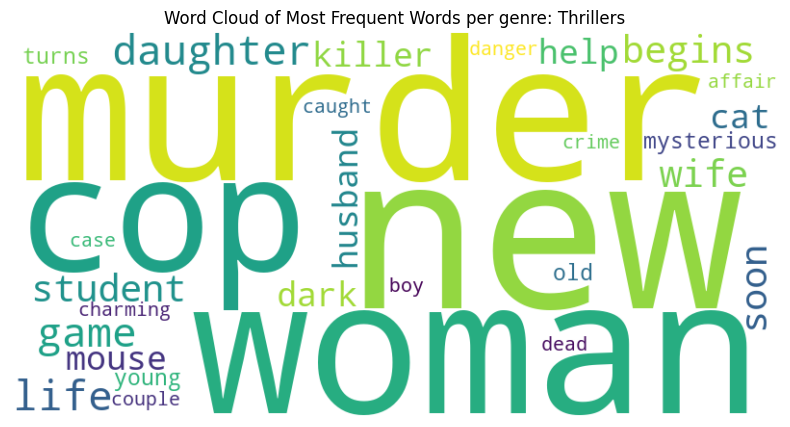

In [ ]:
# generate word clouds by genre

ex8 = df.dropna(subset=["description"]).copy()
ex8["genre"] = ex8["genre"].str.split(",")
ex8 = ex8.explode("genre")
grouped = ex8.groupby("genre")
# test to see if griubed by correctly
# display(grouped["release_year"].mean())
# now need to get word frequency of descriptions removing stop words
# as doing for each genre will generate the plot in a for loop as not specified need to kepe them for later so data can be overwtitten
# more memory efficient 
# need to get the descriptions as a list for the vectorizer list needs to be done by genres

for genre, groupData in grouped:
    # convert descriptions to a list of words
    descriptionList = groupData["description"].dropna().tolist()
    # combines the list of words with other list from the same genre
    text = " ".join(descriptionList)
    # removes filler words
    vectorizer = CountVectorizer(stop_words ="english")
    # creates a sparse matrix of words for that genre
    X = vectorizer.fit_transform([text])
    #sums the columns
    word_counts = X.toarray().sum(axis=0)
    # only want the top 30 words but can only sort through once matched with the corresponding key (word)
    # creates a dicitonary where the word is the key and the count is the number of times the key appeared in text
    word_freq = dict(zip(vectorizer.get_feature_names_out(), word_counts))
    
    # now get top 30 from each and conver to word cloud
    word_freq = dict(sorted(word_freq.items(), key=lambda x:x[1], reverse = True)[:30])
    wordcloud = WordCloud(width=800, height=400, background_color='white')

# Generate the word cloud from frequencies
    wordcloud.generate_from_frequencies(word_freq)

    # Plot the word cloud using matplotlib
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')  # Smooth rendering
    plt.axis('off')  # Hide axes
    plt.title(f"Word Cloud of Most Frequent Words per genre: {genre}")
    plt.show()
    # convert to numpy 2d array
    #adding all values in each column





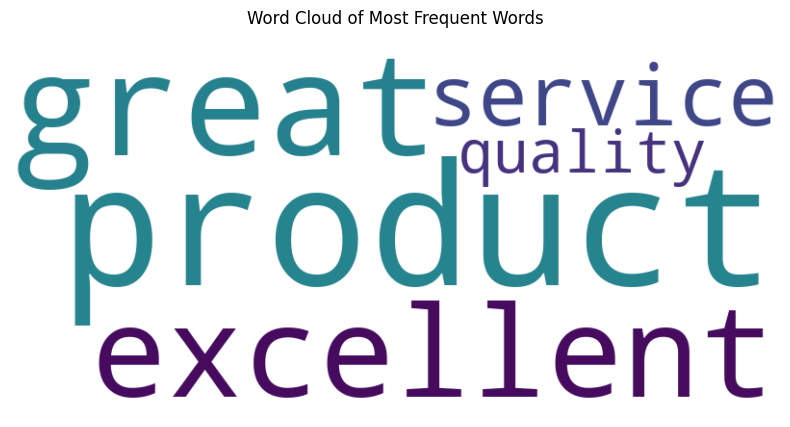

In [11]:
## DEMO OF WORDCLOUD
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Suppose this is your word frequency dictionary
word_freq = {
    'product': 4,
    'great': 3,
    'excellent': 3,
    'service': 2,
    'quality': 1
}

# Create the WordCloud object
wordcloud = WordCloud(width=800, height=400, background_color='white')

# Generate the word cloud from frequencies
wordcloud.generate_from_frequencies(word_freq)

# Plot the word cloud using matplotlib
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')  # Smooth rendering
plt.axis('off')  # Hide axes
plt.title("Word Cloud of Most Frequent Words")
plt.show()

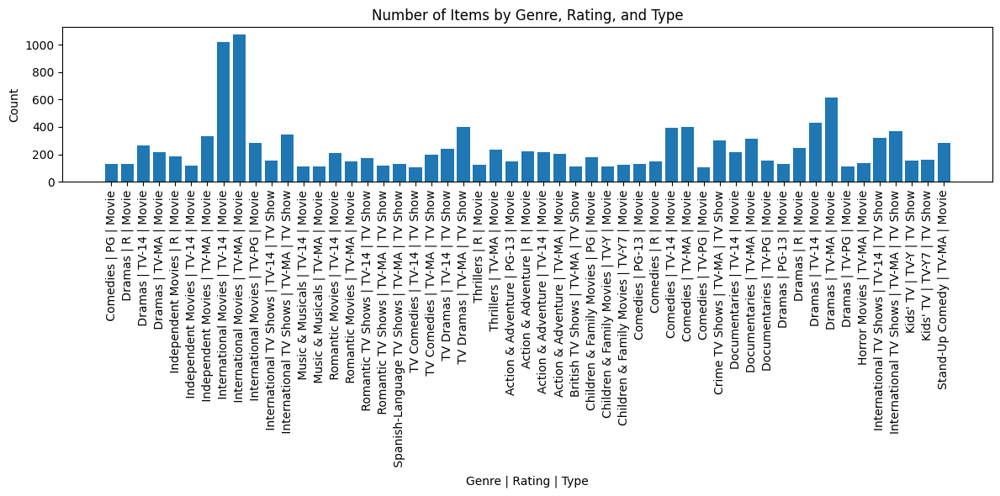

In [8]:
# Create a comparison plot of type rating and genre combinaitons

# First need to combine the 3 points and get rid of any columns wiht missing values

ex9 = df.dropna(subset=["genre","rating","type"]).copy()
#split and explode as multiple genres per record

ex9["genre"] = ex9["genre"].str.split(",")
ex9 = ex9.explode("genre")

grouped = ex9.groupby(["genre", "rating", "type"])
#Test to check grouby worked correctly
#display((grouped["release_year"].mean()).sample(10))

# now want to make a bar chart for the number of items in each group in group 
groupSize = grouped.size().reset_index(name='count')
groupSize = groupSize[groupSize['count'] > 100]

groupSize['label'] = groupSize[['genre', 'rating', 'type']].astype(str).agg(' | '.join, axis=1)

# Plot
plt.figure(figsize=(12, 6))
plt.bar(groupSize['label'], groupSize['count'])
plt.xticks(rotation=90)
plt.xlabel('Genre | Rating | Type')
plt.ylabel('Count')
plt.title('Number of Items by Genre, Rating, and Type')
plt.tight_layout()
plt.show()
